In [ ]:
import numpy as np
import cv2
from skimage import metrics
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
from skimage.util import random_noise

In [ ]:
image_url = '/content/download.jpg'
image = cv2.imread(image_url, cv2.IMREAD_COLOR)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
def add_gaussian_noise(image, variance):
    noisy_img = random_noise(image, mode='gaussian', var=variance)
    noisy_img = (255*noisy_img).astype(np.uint8)
    return noisy_img

In [ ]:
def apply_gaussian_filter(noisy_img):
    filtered_img = cv2.GaussianBlur(noisy_img, (5, 5), 0)
    return filtered_img

In [ ]:
def apply_nlm_filter(noisy_img):
  filtered_img = cv2.fastNlMeansDenoisingColored(noisy_img,None,10,10,7,21)
  return filtered_img

In [ ]:
noise_levels = [0.02,0.04,0.06,0.08,0.10,0.12,0.14,0.16,0.18,0.20,0.22,0.24,0.26,0.28,0.30,0.32,0.34,0.36,0.38,0.40]
ssim_scores = []
colors = []

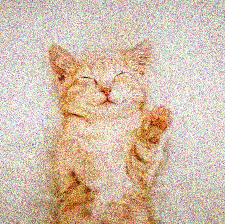

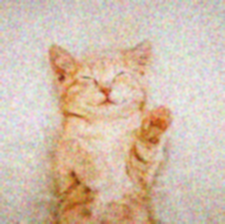

SSIM for noise level 2.0%: 0.787170478233638


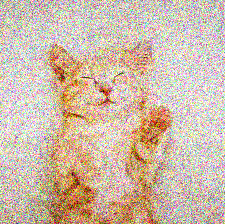

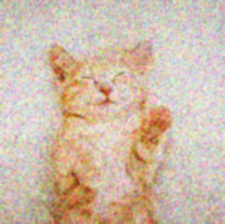

SSIM for noise level 4.0%: 0.6929033703871307


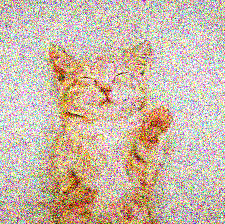

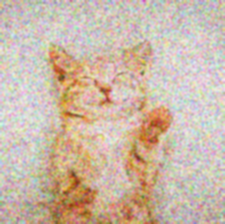

SSIM for noise level 6.0%: 0.6242394797606264


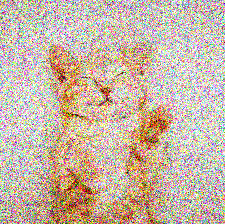

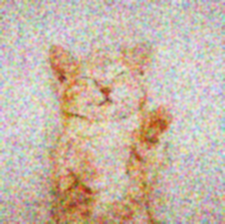

SSIM for noise level 8.0%: 0.5728723833327646


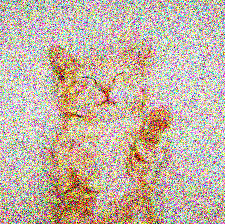

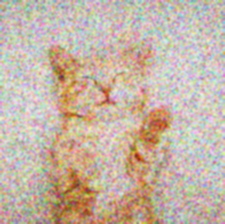

SSIM for noise level 10.0%: 0.5318238561078631


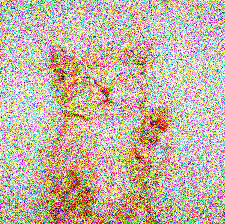

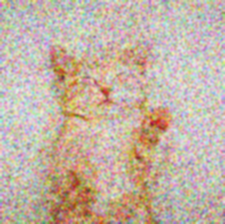

SSIM for noise level 12.0%: 0.5117224429026985


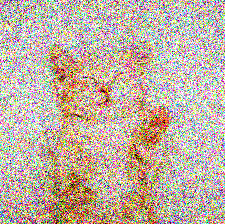

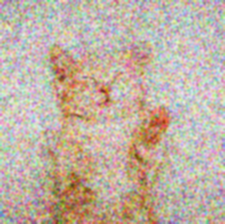

SSIM for noise level 14.000000000000002%: 0.47776859382569437


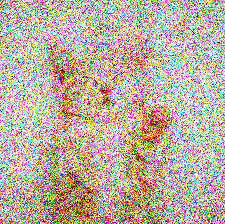

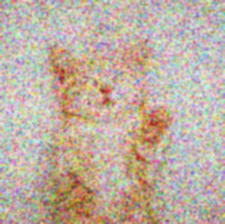

SSIM for noise level 16.0%: 0.4576555254756039


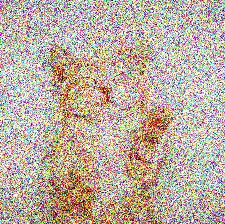

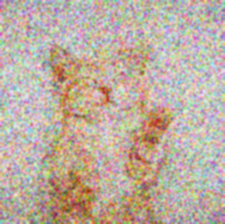

SSIM for noise level 18.0%: 0.4358039232194105


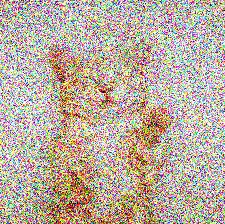

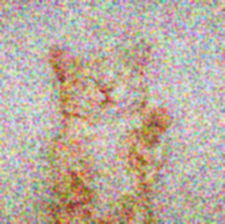

SSIM for noise level 20.0%: 0.4254135170791405


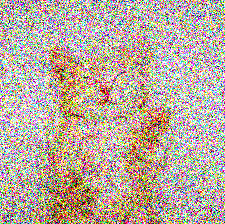

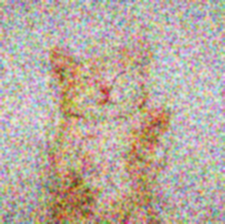

SSIM for noise level 22.0%: 0.4088297654412543


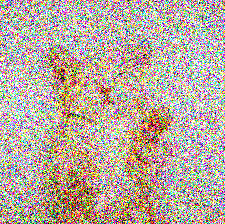

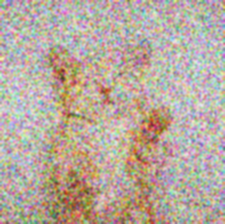

SSIM for noise level 24.0%: 0.3924552048494717


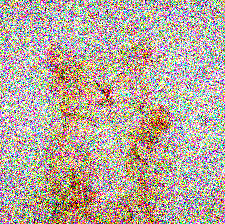

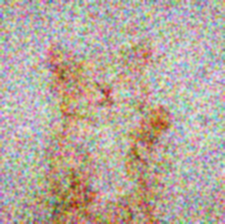

SSIM for noise level 26.0%: 0.38524900650207927


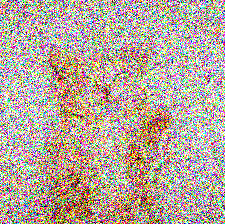

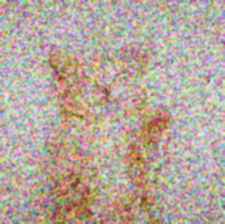

SSIM for noise level 28.000000000000004%: 0.37813695331163166


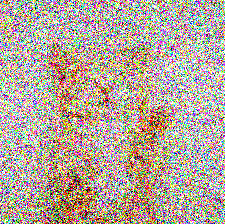

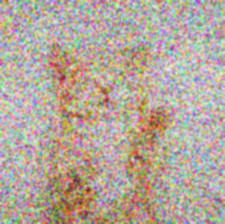

SSIM for noise level 30.0%: 0.36614618655853487


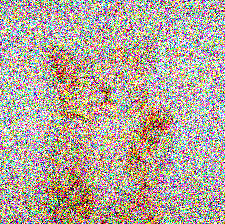

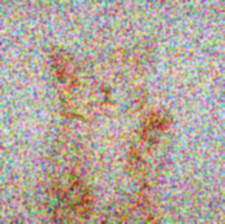

SSIM for noise level 32.0%: 0.35304014726745925


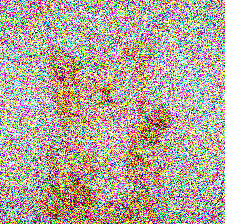

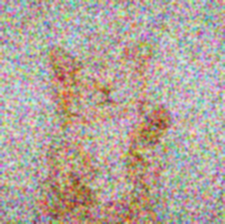

SSIM for noise level 34.0%: 0.3549565365836375


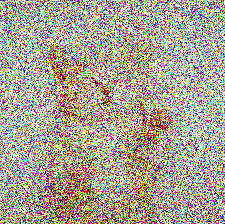

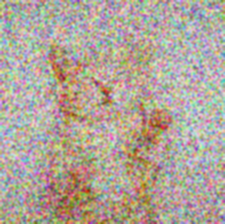

SSIM for noise level 36.0%: 0.3385734738727922


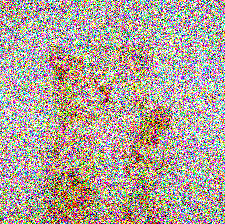

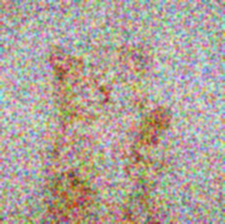

SSIM for noise level 38.0%: 0.3270641869359949


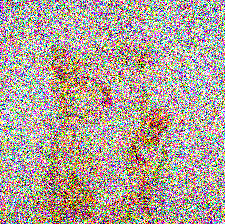

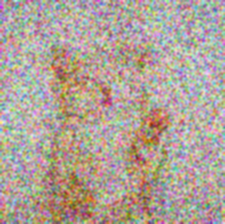

SSIM for noise level 40.0%: 0.3294517660903084


In [ ]:
for noise_level in noise_levels:
    noisy_image = add_gaussian_noise(image, noise_level)
    filtered_image = apply_gaussian_filter(noisy_image)
    ssim = metrics.structural_similarity(image, filtered_image, multichannel=True, win_size=3)
    ssim_scores.append(ssim)  # Calculate and store SSIM for each noise level
    if ssim > 0.77:
        colors.append('red')  # Color red if SSIM is above 0.77
    else:
        colors.append('blue')  # Color blue otherwise
    cv2_imshow(cv2.cvtColor(noisy_image, cv2.COLOR_RGB2BGR))
    cv2_imshow(cv2.cvtColor(filtered_image, cv2.COLOR_RGB2BGR))
    print(f"SSIM for noise level {noise_level * 100}%: {ssim}")

In [ ]:
import pandas as pd

data = {
    'Noise Level (%)': [n * 100 for n in noise_levels],
    'SSIM': ssim_scores
}
df = pd.DataFrame(data)


print(df)


    Noise Level (%)      SSIM
0               2.0  0.787170
1               4.0  0.692903
2               6.0  0.624239
3               8.0  0.572872
4              10.0  0.531824
5              12.0  0.511722
6              14.0  0.477769
7              16.0  0.457656
8              18.0  0.435804
9              20.0  0.425414
10             22.0  0.408830
11             24.0  0.392455
12             26.0  0.385249
13             28.0  0.378137
14             30.0  0.366146
15             32.0  0.353040
16             34.0  0.354957
17             36.0  0.338573
18             38.0  0.327064
19             40.0  0.329452


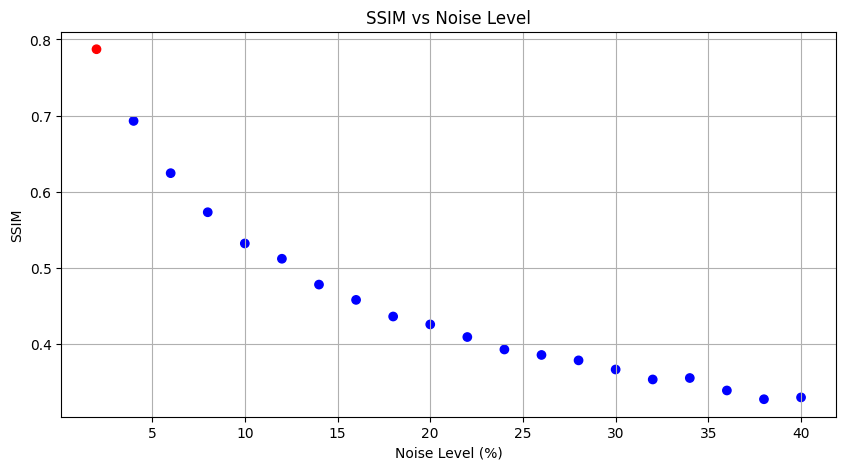

In [ ]:
plt.figure(figsize=(10, 5))
# Scatter plot with different colors based on SSIM values
plt.scatter([n * 100 for n in noise_levels], ssim_scores, marker='o', c=colors)
plt.title('SSIM vs Noise Level')
plt.xlabel('Noise Level (%)')
plt.ylabel('SSIM')
plt.grid(True)
plt.show()

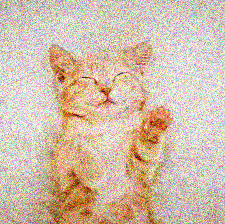

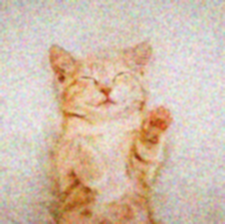

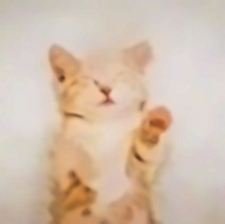

SSIM for noise level 2.0%: 0.9526433938533256


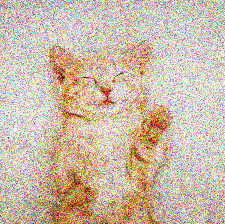

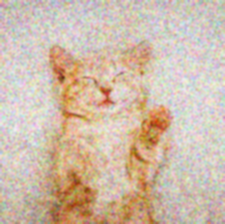

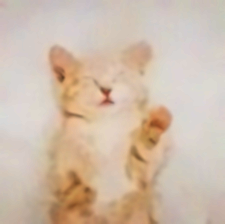

SSIM for noise level 4.0%: 0.9437506532865257


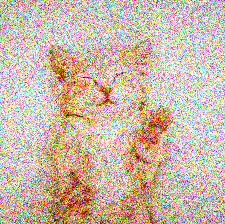

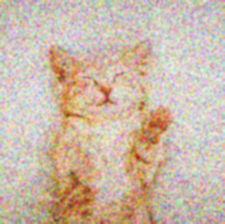

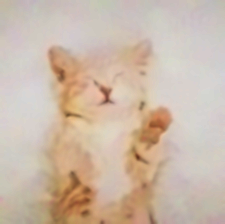

SSIM for noise level 6.0%: 0.9290492619427321


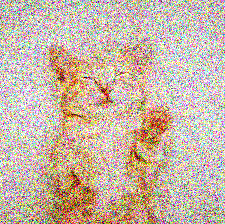

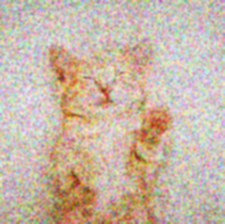

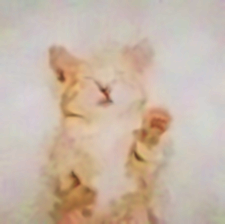

SSIM for noise level 8.0%: 0.9138217739519578


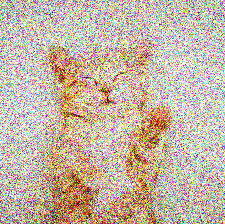

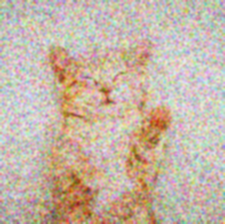

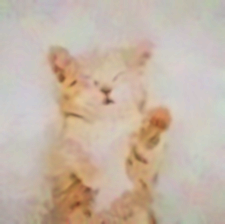

SSIM for noise level 10.0%: 0.892128262319334


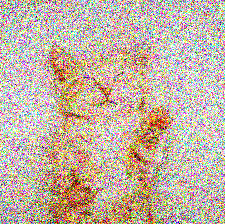

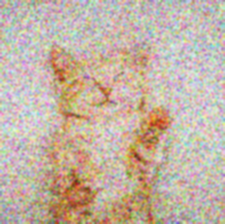

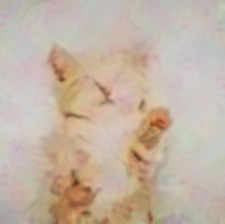

SSIM for noise level 12.0%: 0.883407085420608


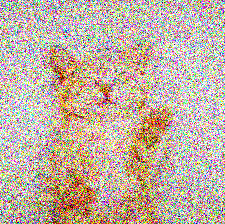

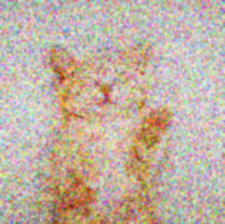

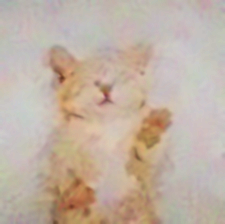

SSIM for noise level 14.000000000000002%: 0.8743454483462721


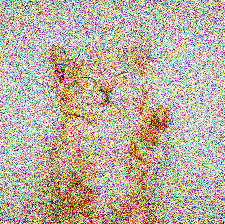

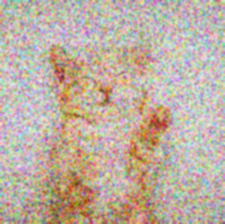

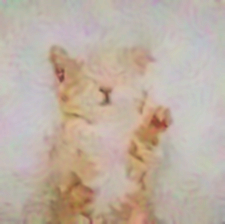

SSIM for noise level 16.0%: 0.8438812863454628


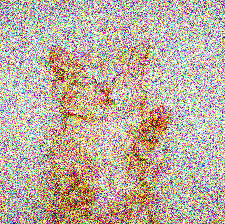

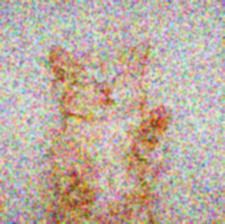

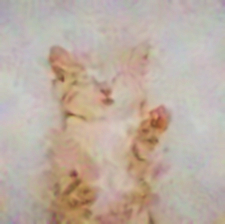

SSIM for noise level 18.0%: 0.838120196705734


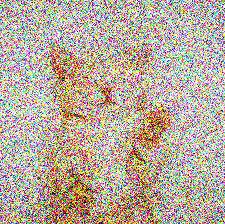

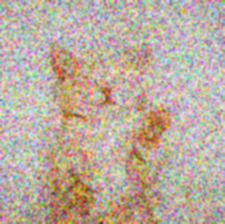

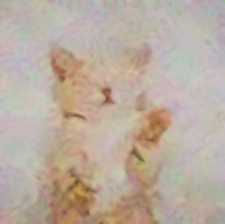

SSIM for noise level 20.0%: 0.8317680621064987


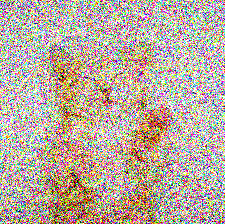

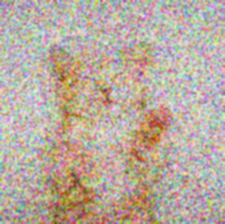

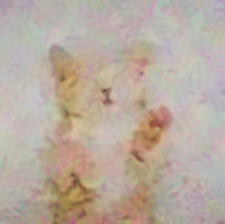

SSIM for noise level 22.0%: 0.804332567412474


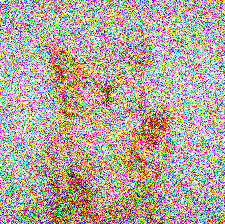

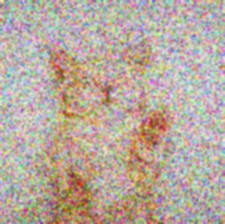

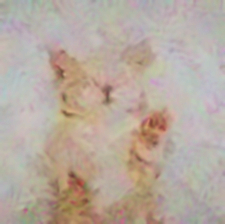

SSIM for noise level 24.0%: 0.7769607703014888


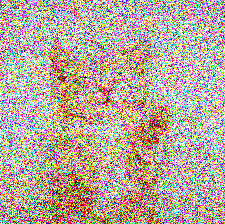

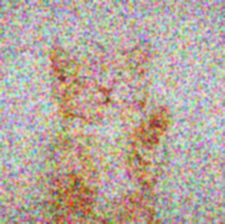

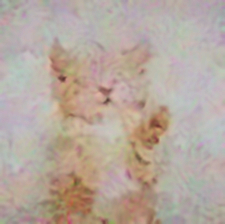

SSIM for noise level 26.0%: 0.7740271863688316


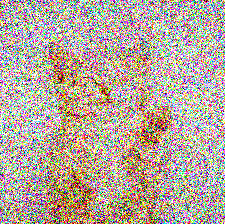

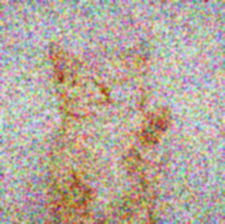

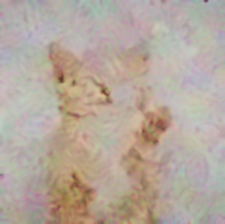

SSIM for noise level 28.000000000000004%: 0.7717261476431155


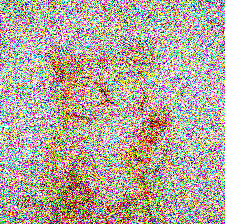

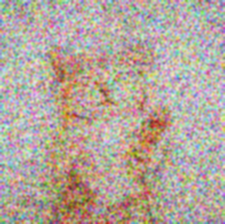

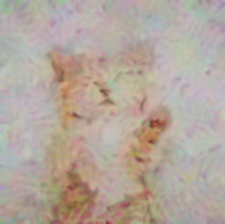

SSIM for noise level 30.0%: 0.7481555519803109


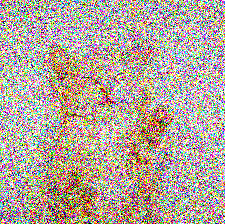

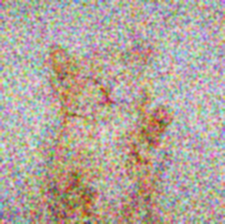

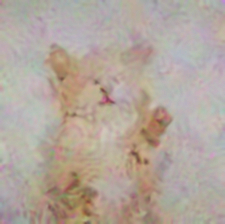

SSIM for noise level 32.0%: 0.7555997308500969


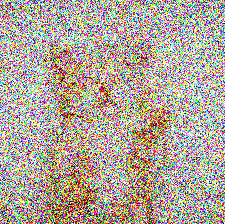

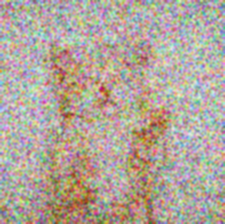

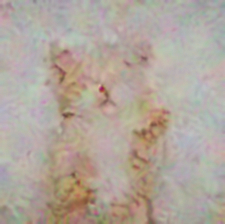

SSIM for noise level 34.0%: 0.7234403287356544


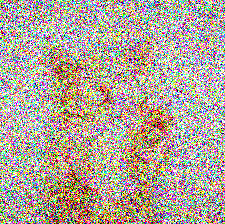

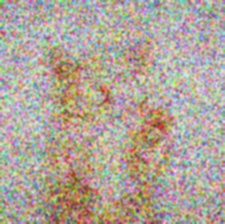

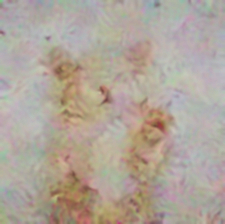

SSIM for noise level 36.0%: 0.7263113199778182


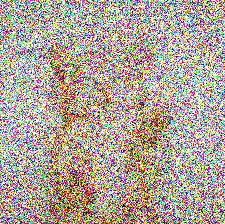

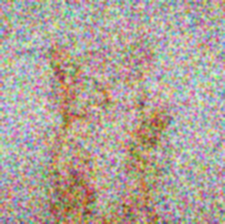

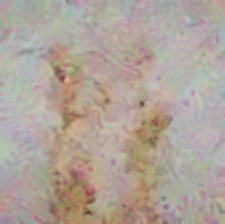

SSIM for noise level 38.0%: 0.7180625328704485


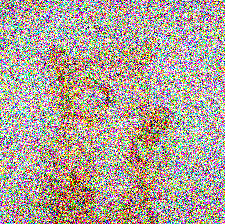

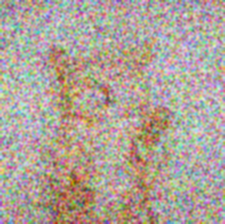

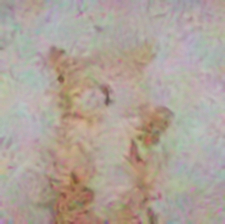

SSIM for noise level 40.0%: 0.7065261250052396
    Noise Level (%)      SSIM
0               2.0  0.952643
1               4.0  0.943751
2               6.0  0.929049
3               8.0  0.913822
4              10.0  0.892128
5              12.0  0.883407
6              14.0  0.874345
7              16.0  0.843881
8              18.0  0.838120
9              20.0  0.831768
10             22.0  0.804333
11             24.0  0.776961
12             26.0  0.774027
13             28.0  0.771726
14             30.0  0.748156
15             32.0  0.755600
16             34.0  0.723440
17             36.0  0.726311
18             38.0  0.718063
19             40.0  0.706526


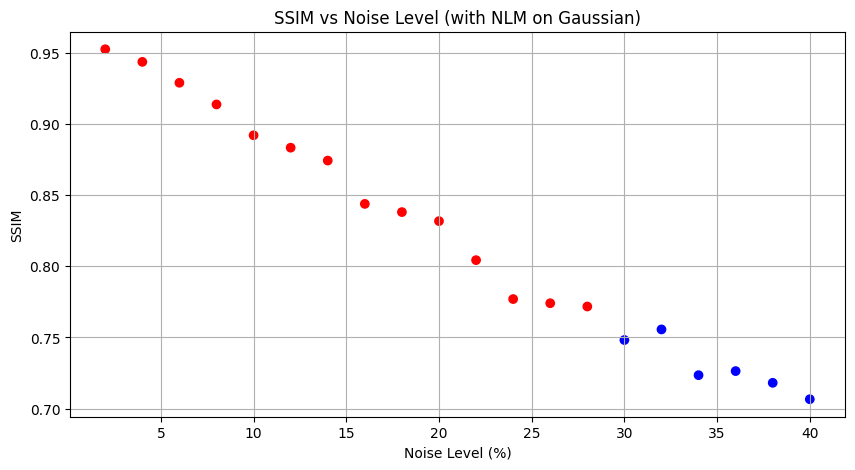

In [ ]:
noise_levels = [0.02,0.04,0.06,0.08,0.10,0.12,0.14,0.16,0.18,0.20,0.22,0.24,0.26,0.28,0.30,0.32,0.34,0.36,0.38,0.40]
ssim_scores = []
colors = []
for noise_level in noise_levels:
    noisy_image = add_gaussian_noise(image, noise_level)
    filtered_image_gaussian = apply_gaussian_filter(noisy_image) # Apply Gaussian filter
    filtered_image_nlm = apply_nlm_filter(filtered_image_gaussian) # Apply NLM filter on Gaussian filtered image
    ssim = metrics.structural_similarity(image, filtered_image_nlm, multichannel=True, win_size=3)
    ssim_scores.append(ssim)  # Calculate and store SSIM for each noise level
    if ssim > 0.77:
        colors.append('red')  # Color red if SSIM is above 0.77
    else:
        colors.append('blue')  # Color blue otherwise
    cv2_imshow(cv2.cvtColor(noisy_image, cv2.COLOR_RGB2BGR))
    cv2_imshow(cv2.cvtColor(filtered_image_gaussian, cv2.COLOR_RGB2BGR)) # Display Gaussian filtered image
    cv2_imshow(cv2.cvtColor(filtered_image_nlm, cv2.COLOR_RGB2BGR)) # Display NLM filtered image
    print(f"SSIM for noise level {noise_level * 100}%: {ssim}")




In [ ]:

data = {
    'Noise Level (%)': [n * 100 for n in noise_levels],
    'SSIM': ssim_scores
}
df = pd.DataFrame(data)


print(df)

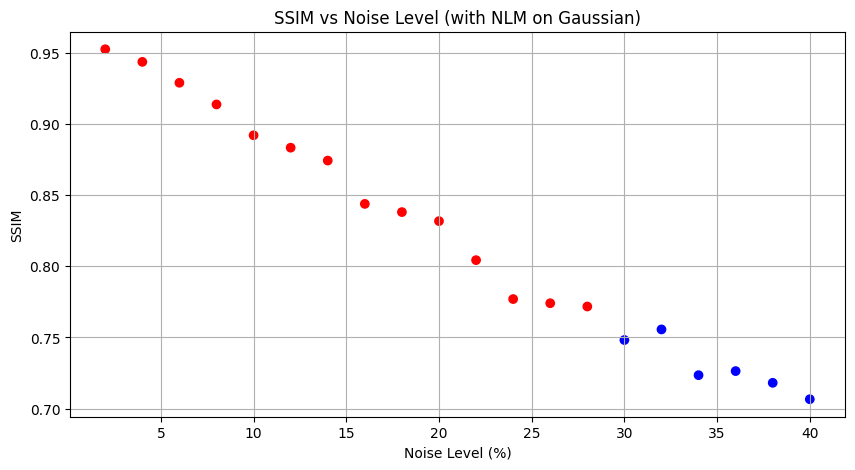

In [ ]:
plt.figure(figsize=(10, 5))
# Scatter plot with different colors based on SSIM values
plt.scatter([n * 100 for n in noise_levels], ssim_scores, marker='o', c=colors)
plt.title('SSIM vs Noise Level (with NLM on Gaussian)')
plt.xlabel('Noise Level (%)')
plt.ylabel('SSIM')
plt.grid(True)
plt.show()